# Tugas Analisis Multimedia: Audio, Gambar, Video

**Mata Kuliah:** Sistem & Teknologi Multimedia  
**Nama:** Aziz Kurniawan
**NIM:** 122140097  

---

## Deskripsi Tugas

Tugas ini bertujuan untuk memahami representasi dasar data multimedia (audio, gambar, dan video) melalui praktik langsung memuat data, visualisasi, dan ekstraksi informasi fundamental. Anda akan bekerja dengan tiga jenis media berbeda untuk menganalisis karakteristik temporal (audio), spasial (gambar), dan spatio-temporal (video).

Fokus tugas adalah pada pemahaman konsep dasar representasi multimedia dan kemampuan interpretasi hasil visualisasi, **bukan** pada manipulasi atau transformasi lanjutan data multimedia.

---

In [30]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import librosa
import soundfile as sf
from PIL import Image
import cv2
from IPython.display import Audio, HTML, display
import os

%matplotlib inline

print("Library versions:")
print(f"NumPy: {np.__version__}")
print(f"Matplotlib: {matplotlib.__version__}")
print(f"Librosa: {librosa.__version__}")
print(f"OpenCV: {cv2.__version__}")

from IPython.display import Audio
from pathlib import Path
import librosa.display as lbd

Library versions:
NumPy: 2.2.6
Matplotlib: 3.10.6
Librosa: 0.11.0
OpenCV: 4.12.0


## Checklist Kelengkapan (Centang ✅ saat selesai)

### 🎵 Bagian Audio
- [✅] Muat audio dan tampilkan metadata (durasi, sample rate, jumlah kanal)
- [✅] Tampilkan waveform dengan label sumbu yang jelas
- [✅] Tampilkan spectrogram dalam skala log-dB dengan colorbar
- [✅] Tampilkan MFCC (minimal 13 koefisien) sebagai heatmap
- [ ] Berikan interpretasi dan analisis untuk setiap visualisasi audio

### 🖼️ Bagian Gambar
- [✅] Tampilkan gambar dengan benar dalam format RGB
- [✅] Tampilkan informasi dasar (dimensi, jumlah kanal, dtype)
- [✅] Tampilkan histogram warna untuk channel R, G, B
- [✅] Berikan analisis hubungan histogram dengan kesan visual gambar

### 📹 Bagian Video
- [✅] Tampilkan metadata video (resolusi, fps, frame count, durasi)
- [✅] Tampilkan 3 frame representatif (awal, tengah, akhir)
- [✅] Konversi BGR ke RGB dengan benar untuk visualisasi
- [✅] Analisis kesesuaian parameter video dengan use case

### 📝 Analisis & Dokumentasi
- [✅] Setiap bagian memiliki interpretasi dan analisis ringkas
- [✅] Perbandingan representasi ketiga jenis media
- [✅] Kesimpulan pembelajaran dan refleksi
- [✅] Semua sumber data dan referensi dicantumkan

# Bagian A — Audio

### A1. Deskripsi Data

**TODO:** Jelaskan audio yang akan Anda analisis:
- Jenis audio: Pidato
- Sumber: [Youtube Short](https://youtube.com/shorts/c2GDzfnv6BU?si=vqAneDRQ0U3ft1dU)
- Format file: WAV
- Alasan pemilihan: Karena suara manusia cenderung di tengah frekuensinya, namun dengan kondisi alat rekam jaman dulu menarik untuk di analisis karena akan kah ada suara angin yang bocor atau mic yang noisy.

**Path file:** `data/audio_proklamasi_soekarno.wav`

---

### A2. TODO: Muat & Metadata

**Instruksi:**
Tulis kode untuk memuat file audio dan menampilkan metadata dasar:
- Sample rate (Hz)
- Durasi (detik)
- Jumlah kanal (mono/stereo)
- Jumlah total sampel

**Catatan:** Jika file MP3 bermasalah saat loading, gunakan format WAV sebagai alternatif.

In [10]:
path = Path("data/audio_proklamasi_soekarno.wav")
assert path.exists(), f"File tidak ditemukan: {path.resolve()}"

with sf.SoundFile(path) as f:
    sr = f.samplerate
    channels = f.channels
    frames = len(f)

duration = frames / sr
label = "mono" if channels == 1 else "stereo"

print(f"Sample rate (Hz): {sr}")
print(f"Durasi (detik): {duration:.2f}")
print(f"Jumlah kanal: {channels} ({label})")
print(f"Jumlah total sampel: {frames}")
Audio(path)


Sample rate (Hz): 44100
Durasi (detik): 48.62
Jumlah kanal: 2 (stereo)
Jumlah total sampel: 2144256


### A3. TODO: Waveform

**Instruksi:**
Plot waveform audio dengan:
- Sumbu X: waktu (detik)
- Sumbu Y: amplitudo
- Judul dan label sumbu yang jelas

**Analisis yang diperlukan:**
Jelaskan apa yang Anda lihat dari waveform (pola amplitudo, bagian keras/pelan, dll.)

=== Info matriks ===
Stereo shape: (2144256, 2)  (kolom 0=L, 1=R)
Mono shape  : (2144256, 1)    (kolom tunggal)
File asli stereo


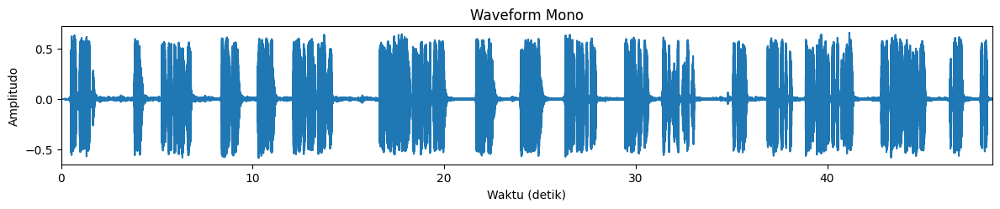

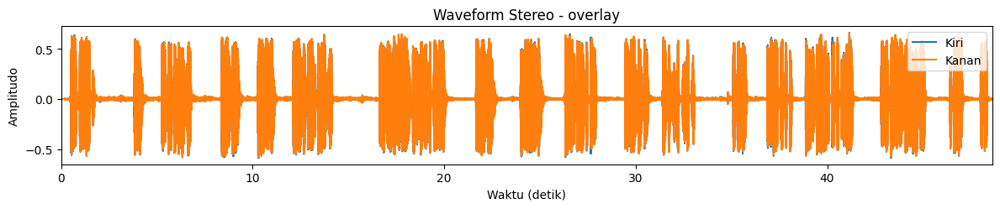

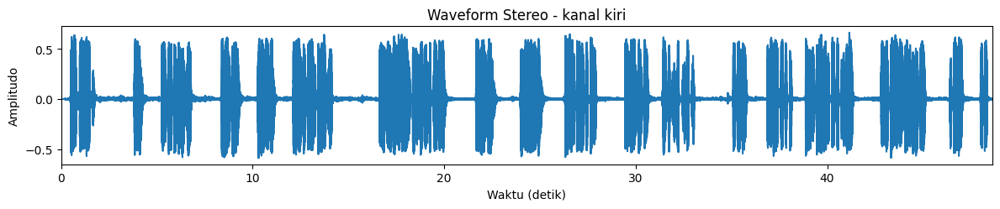

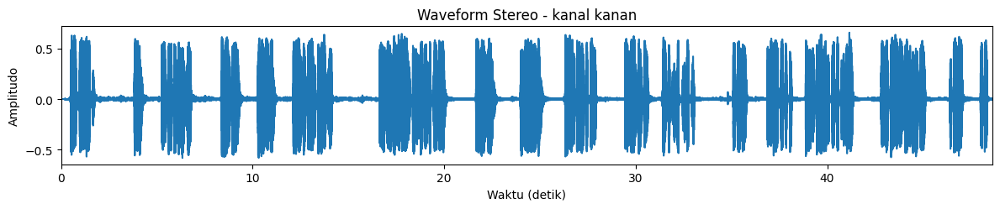

In [14]:
y, sr = sf.read(path, dtype="float32", always_2d=True)
n, ch = y.shape

if ch == 1:
    stereo = np.repeat(y, 2, axis=1)
    info = "File asli mono, dibuat dual-mono untuk visual stereo"
else:
    stereo = y
    info = "File asli stereo"

mono_vec = stereo.mean(axis=1)
mono = mono_vec[:, None]

# Vektor waktu
t = np.arange(n) / sr

print("=== Info matriks ===")
print(f"Stereo shape: {stereo.shape}  (kolom 0=L, 1=R)")
print(f"Mono shape  : {mono.shape}    (kolom tunggal)")
print(info)

# 1) Mono
plt.figure(figsize=(12, 2.6))
plt.plot(t, mono_vec)
plt.title("Waveform Mono")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.xlim(0, t[-1])
plt.tight_layout()
plt.show()

# 2) Stereo 1 graf (overlay L dan R)
plt.figure(figsize=(12, 2.6))
plt.plot(t, stereo[:, 0], label="Kiri")
plt.plot(t, stereo[:, 1], label="Kanan")
plt.title("Waveform Stereo - overlay")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.legend(loc="upper right")
plt.xlim(0, t[-1])
plt.tight_layout()
plt.show()

# 3) Stereo kanal kiri
plt.figure(figsize=(12, 2.6))
plt.plot(t, stereo[:, 0])
plt.title("Waveform Stereo - kanal kiri")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.xlim(0, t[-1])
plt.tight_layout()
plt.show()

# 4) Stereo kanal kanan
plt.figure(figsize=(12, 2.6))
plt.plot(t, stereo[:, 1])
plt.title("Waveform Stereo - kanal kanan")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.xlim(0, t[-1])
plt.tight_layout()
plt.show()


**Ringkasan yang terlihat**

- Struktur pidatonya terasa jelas, polanya keping keping lalu ada blok rapat saat mengucap kata terus jeda, jadi ini khas dengan pidato tegas ritmenya.
- Di jeda tipis sekali noise nya, artinya humm atau hiss tidak terlalu menonjol kalau dilihat dari waveform. bisa jadi karena efek kompresi dari Youtube(mungkin) kalaupun ada noise baru bisa jelas pada visualisasi Spectrogram.
- Pada plot overlay garis biru hampir tertutupi oleh garis oranye, mungkin sumbernya mono yang digandakan ke 2 kanal. Jadi secara spasial tidak ada informasi kiri kanan yang berbeda.

### A4. TODO: Spectrogram log-dB

**Instruksi:**
Hitung STFT dan tampilkan spectrogram dalam skala log-dB:
- Gunakan parameter standar (n_fft=1024, hop_length=256)
- Tampilkan dengan colorbar
- Label sumbu: waktu (detik) dan frekuensi (Hz)

**Analisis yang diperlukan:**
Jelaskan perbedaan informasi yang didapat dari spectrogram dibanding waveform.

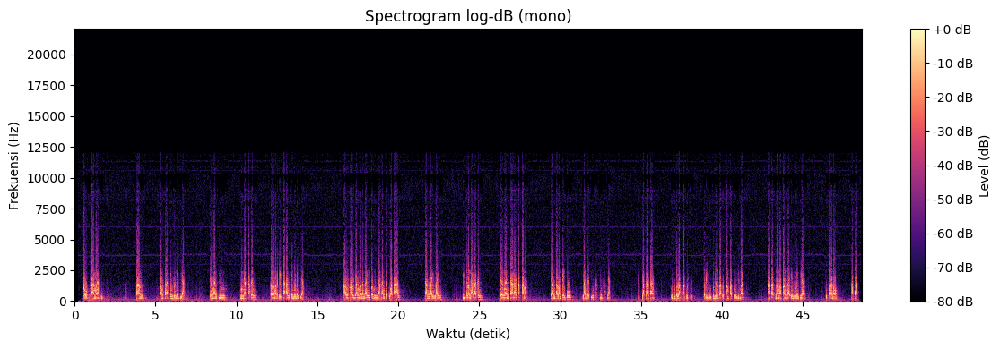

In [17]:
y_mono = y.mean(axis=1)

# Parameter STFT
n_fft = 1024
hop_length = 256
window = "hann"

# STFT -> magnitude -> log-dB
D = librosa.stft(y=y_mono, n_fft=n_fft, hop_length=hop_length, window=window, center=True)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max, top_db=80)

# Plot
plt.figure(figsize=(12, 4))
img = lbd.specshow(S_db, sr=sr, hop_length=hop_length, x_axis="time", y_axis="linear")
cbar = plt.colorbar(img, format="%+2.0f dB")
cbar.set_label("Level (dB)")
plt.title("Spectrogram log-dB (mono)")
plt.xlabel("Waktu (detik)")
plt.ylabel("Frekuensi (Hz)")
plt.tight_layout()
plt.show()

**Ringkasan yang terlihat**

- Di waveform tadi kita lihat blok-blok pidato yang rapi, keras lalu jeda. Di spectrogram, blok yang sama berubah jadi kilatan terang di rentang 300 sampai kira-kira 3000 Hz. Itu tanda vokal.
- Tidak ada tanda clipping mencolok, dugaan dual mono, dan noise angin atau hiss tidak dominan di gambar ini.

### A5. TODO: MFCC

**Instruksi:**
Hitung dan tampilkan minimal 13 koefisien MFCC sebagai heatmap:
- Sumbu X: waktu (frame)
- Sumbu Y: koefisien MFCC (1-13)
- Gunakan colorbar dan judul yang jelas

**Analisis yang diperlukan:**
Interpretasi sederhana: apakah pola MFCC stabil atau berubah-ubah? Apa potensi maknanya?

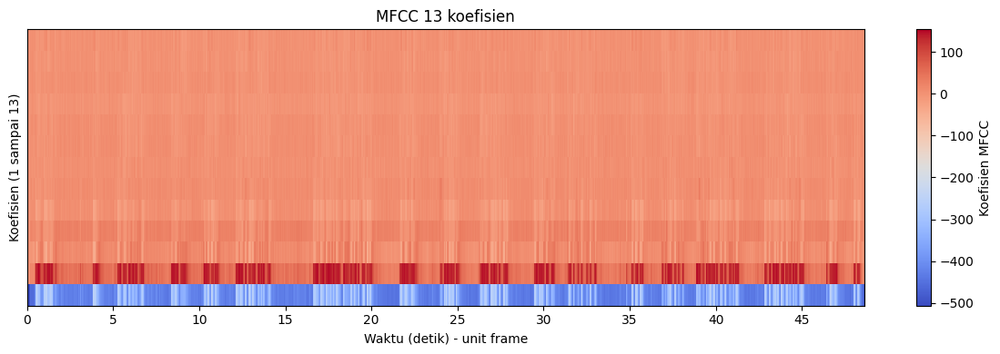

In [20]:
n_mfcc = 13
n_mels = 40

# Mel-spectrogram -> MFCC
S_mel = librosa.feature.melspectrogram(
    y=y_mono, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, power=2.0
)
mfcc = librosa.feature.mfcc(S=librosa.power_to_db(S_mel, ref=np.max), n_mfcc=n_mfcc)

# Plot heatmap MFCC
plt.figure(figsize=(12, 4))
img = lbd.specshow(
    mfcc,
    x_axis="time",
    sr=sr,
    hop_length=hop_length,
)
cbar = plt.colorbar(img)
cbar.set_label("Koefisien MFCC")
plt.title("MFCC 13 koefisien")
plt.ylabel("Koefisien (1 sampai 13)")
plt.xlabel("Waktu (detik) - unit frame")
plt.tight_layout()
plt.show()


**Analisis**

**1. Stabil atau berubah-ubah?**

- Secara umum stabil di bagian vokal yang panjang.
- Berubah-ubah di batas frasa, terutama saat konsonan yang meledak atau penekanan kata. Perubahannya tidak liar, lebih ke pola yang naik sebentar lalu kembali tenang.

**2. Maknanya apa untuk kasus rekaman pidato jadul dari YouTube?**
- Stabilnya pola MFCC menandakan cara baca yang konsisten. Cocok dengan pidato formal yang ritmenya rapi seperti yang terlihat di waveform.
- Variasi yang tidak terlalu ekstrem di koefisien lebih tinggi menguatkan pengamatan spectrogram bahwa energi frekuensi tinggi tidak dominan. Kompresi platform juga cenderung menghaluskan detail di atas.
- Coretan vertikal saat penekanan sesuai puncak amplitudo di waveform. Jadi tiga tampilan saling nyambung, waveform menunjukkan kapan kerasnya, spectrogram menunjukkan frekuensi mana yang aktif, MFCC merangkum bentuk spektral inti yang relatif ajek dengan lonjakan saat artikulasi.

### A6. Analisis Ringkas (Wajib)

**Jawab pertanyaan berikut:**

1. **Perbedaan insight:** Apa perbedaan informasi yang didapat dari waveform versus spectrogram?

   *Waveform menjawab kapan sesuatu terjadi dan seberapa keras. Dari plot terlihat blok pidato yang rapi, puncak cukup sering tapi tidak gepeng jadi kecil kemungkinan clipping, serta jeda yang bersih.*

   *Spectrogram menjawab apa yang bunyi pada saat itu. Vokal tampak sebagai pita energi kuat di kisaran 300 sampai sekitar 3000 Hz, konsonan desis muncul sebagai kilatan tipis di bagian lebih tinggi, dan bagian atas terlihat gelap jadi energi frekuensi sangat tinggi minim.*
   *Spectrogram juga membantu cek jejak noise. Di gambarmu tidak tampak garis hum yang jelas dan hiss tidak dominan. Ini nyambung dengan sumber YouTube dan dugaan dual mono dari overlay stereo sebelumnya.*

   *Intinya, waveform bagus untuk ritme dan dinamika, spectrogram bagus untuk isi frekuensi dan karakter bunyi.*

2. **Pembelajaran dari MFCC:** Apa yang Anda pelajari dari visualisasi MFCC audio ini?

   *Pola MFCC cenderung stabil pada bagian vokal dan berubah lokal saat transisi atau penekanan kata. Ini cocok dengan gaya pidato formal yang ritmis.*

   *Koefisien awal yang fluktuatif mengikuti buka-tutup suara, sementara koefisien lebih tinggi tidak liar, menandakan detail frekuensi atas tidak dominan dan bisa jadi terhalus oleh kompresi YouTube.*

   *Secara keseluruhan MFCC merangkum bahwa warna suara pembicara konsisten, dengan lonjakan yang muncul saat artikulasi konsonan atau aksen kata. Jika ingin menonjolkan transisi, kamu bisa tambahkan delta MFCC di langkah lanjut.*

# Bagian B — Gambar

### B1. Deskripsi Data

**TODO:** Jelaskan gambar yang akan Anda analisis:
- Jenis gambar: Foto Olahraga, Dunk
- Sumber: [Pinterest](https://pin.it/68KaIIMW4)
- Format file: JPEG
- Alasan pemilihan: Kontras warna kuat dan banyak detail tekstur. Cocok untuk eksplorasi ruang warna, channel R-G-B. Idola saya kebetulan.

**Path file:** `data/gambar_kobe_bryan.jpeg` 

---

### B2. TODO: Baca & Tampilkan (RGB)

**Instruksi:**
Baca gambar dan tampilkan dengan benar dalam format RGB:
- Pastikan konversi warna benar (ingat perbedaan BGR vs RGB di OpenCV)
- Berikan judul yang deskriptif
- Hilangkan axis untuk tampilan yang bersih

**Analisis yang diperlukan:**
Jelaskan gambar secara ringkas (objek dominan, kondisi pencahayaan, komposisi warna).

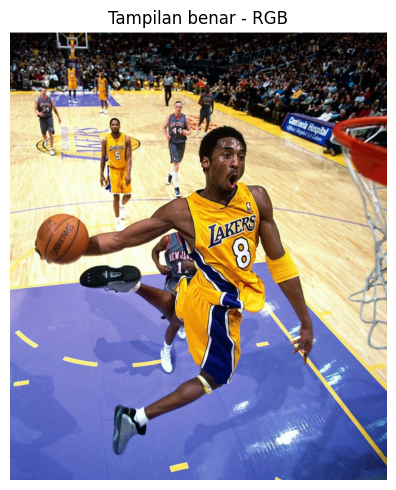

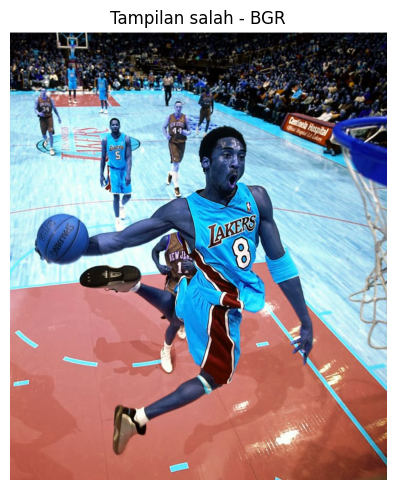

In [31]:
path = Path("data/gambar_kobe_bryan.jpeg")

img_bgr = cv2.imread(str(path), -1)
if img_bgr is None:
    raise RuntimeError("Gagal memuat gambar")

if img_bgr.ndim == 2:
    img_rgb = img_bgr
elif img_bgr.shape[2] == 3:
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
elif img_bgr.shape[2] == 4:
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGRA2RGBA)
else:
    raise ValueError(f"Bentuk kanal tidak didukung: {img_bgr.shape}")

plt.figure(figsize=(8, 5))
plt.imshow(img_rgb)
plt.title("Tampilan benar - RGB")
plt.axis("off")
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 5))
plt.imshow(img_bgr)
plt.title("Tampilan salah - BGR")
plt.axis("off")
plt.tight_layout()
plt.show()


### B3. TODO: Informasi Dasar

**Instruksi:**
Tampilkan informasi metadata gambar:
- Dimensi (Height × Width)
- Jumlah kanal
- Tipe data (dtype)
- Mode warna (jika relevan)
- Ukuran file dalam memori

**Analisis yang diperlukan:**
Jelaskan mengapa informasi ini penting untuk tahap preprocessing atau analisis lanjutan.

In [25]:
img = Image.open(path)
mode = img.mode
W, H = img.size

arr = np.asarray(img)
dtype = arr.dtype
if arr.ndim == 2:
    channels = 1
else:
    channels = arr.shape[2]

mem_bytes = arr.nbytes
mem_mb = mem_bytes / (1024**2)

print("=== Informasi Dasar Gambar ===")
print(f"Path                 : {path.name}")
print(f"Dimensi (H x W)      : {H} x {W} piksel")
print(f"Jumlah kanal         : {channels}")
print(f"Tipe data (dtype)    : {dtype}")
print(f"Mode warna (PIL)     : {mode}")
print(f"Ukuran di memori     : {mem_mb:.2f} MB  ({mem_bytes} bytes)")

=== Informasi Dasar Gambar ===
Path                 : gambar_kobe_bryan.jpeg
Dimensi (H x W)      : 876 x 736 piksel
Jumlah kanal         : 3
Tipe data (dtype)    : uint8
Mode warna (PIL)     : RGB
Ukuran di memori     : 1.84 MB  (1934208 bytes)


**Analisis**

- Dimesi di perlukan untuk menjaga aspek ratio jika melakukan crop atau resize dan mengukur atau menilai memori yang digunakan.
- Jumlah kanal dilihat  untuk menentukan pipeline dalam tugas ini memerlukan RGB untuk pemrosesan jadi jika gambar RGBA bisa tau jika perlu koversi agar konsisten.
- Dtype digunakan untuk menentukan bit gambar, umumnya uint8 dengan nilai 0-255. 
- Mode warna memberitahu ruang warna yang aktif dan apakah ada alpha. Ini menghindari salah kanal seperti kasus BGR vs RGB.
- Ukuran memori penting dalam untuk preprocessing karena membantu merencanakan batch size, keputusan downscale, atau tiling supaya pemakaian RAM atau VRAM tetap aman saat analisis lanjutan.

### B4. TODO: Histogram Warna

**Instruksi:**
Tampilkan histogram distribusi intensitas untuk channel R, G, B:
- Range: 0-255
- Plot terpisah atau overlay dengan warna sesuai channel
- Label sumbu: intensitas pixel dan frekuensi
- Legend yang jelas

**Analisis yang diperlukan:**
Analisis: channel mana yang dominan? Bagaimana kontras gambar? Seperti apa sebaran intensitasnya?

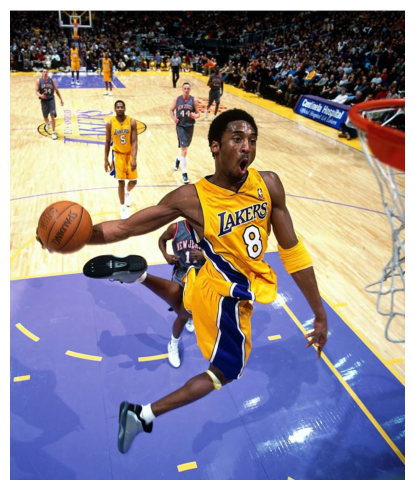

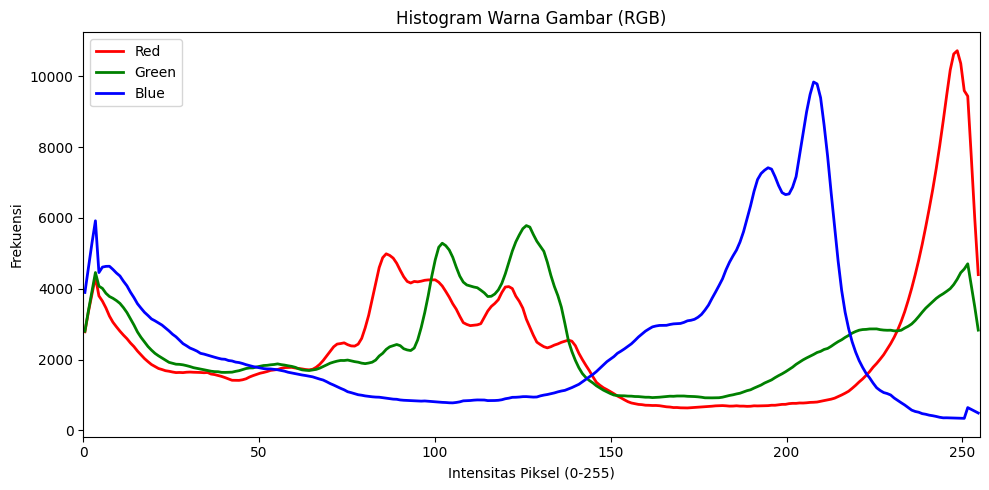

In [33]:
R = img_rgb[:, :, 0].ravel()
G = img_rgb[:, :, 1].ravel()
B = img_rgb[:, :, 2].ravel()

bins = 256
hist_R, edges = np.histogram(R, bins=bins, range=(0, 255))
hist_G, _     = np.histogram(G, bins=bins, range=(0, 255))
hist_B, _     = np.histogram(B, bins=bins, range=(0, 255))
x = edges[:-1] + 0.5  

def smooth(y, k=7):
    k = max(1, int(k))
    if k % 2 == 0: k += 1
    kernel = np.ones(k) / k
    return np.convolve(y, kernel, mode="same")

hist_R_s = smooth(hist_R, k=7)
hist_G_s = smooth(hist_G, k=7)
hist_B_s = smooth(hist_B, k=7)

plt.figure(figsize=(8, 5))
plt.imshow(img_rgb)
plt.axis("off")
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(x, hist_R_s, label="Red", color="red", linewidth=2)
plt.plot(x, hist_G_s, label="Green", color="green", linewidth=2)
plt.plot(x, hist_B_s, label="Blue", color="blue", linewidth=2)
plt.title("Histogram Warna Gambar (RGB)")
plt.xlabel("Intensitas Piksel (0-255)")
plt.ylabel("Frekuensi")
plt.xlim(0, 255)
plt.legend()
plt.tight_layout()
plt.show()


**Analisis**

- Channel yang dominan adalah pada channel blue dan red pada nilai itensitas pixel yang tinggi.
    - Red paling dominan di area highlight. Terlihat puncak besar di intensitas sangat tinggi sekitar 245 sampai 255. Ini sesuai dengan bagian kuning pada jersey dan pantulan lantai kayu.
    - Blue juga kuat, terutama puncak lebar di 190 sampai 215. Ini masuk akal dengan elemen ungu dan biru di lapangan serta aksen seragam.
    - Green menonjol di midtone sekitar 100 sampai 130, lalu ikut naik di highlight tapi tidak setinggi Red. Midtone hijau ini datang dari lantai kayu dan area kulit.

- Kontras gambar
    - Sebaran melintas hampir seluruh rentang 0 sampai 255 dengan puncak jelas di ujung kanan untuk Red dan puncak tinggi Blue di area terang. Ada juga akumulasi nilai rendah pada Blue di kisaran 0 sampai 10 untuk area bayangan dan latar gelap.
    - Kombinasi ada piksel gelap dan banyak highlight berarti kontras cenderung tinggi.

- Sebaran intensitas
    - Multimodal di tiap channel. Red punya dua punggung utama di midtone menengah dan spike di highlight. Green dominan di midtone lalu menurun di highlight. Blue punya punggung di midtone tinggi sampai highlight serta ekor di nilai rendah.
    - Artinya warna gambar tidak rata. Ada kelompok piksel gelap di latar, midtone dari lantai dan kulit, serta highlight kuat di jersey dan pantulan lapangan. Ini sesuai konteks foto indoor arena dengan lampu kuat dari atas.

### B5. Analisis Ringkas (Wajib)

**Jawab pertanyaan berikut:**

**Relasi histogram dengan kesan visual:** Apa hubungan antara pola histogram yang Anda lihat dengan kesan visual gambar (terang/gelap, warna dominan, kontras)?

*Jawaban Anda:* 

- Kesan terang gelap 
    sebaran intensitas melebar dari rendah sampai sangat tinggi. Puncak besar Red di 245 sampai 255 bikin highlight terasa terang pada jersey kuning dan pantulan lantai. Ada ekor nilai rendah terutama pada Blue yang mewakili latar penonton yang gelap, jadi subjek terlihat menonjol.

- Warna dominan 
    Red kuat di highlight dan Green cukup tinggi di midtone sehingga campurannya memberi rasa kuning hangat pada seragam dan lantai. Blue punya punggung lebar di midtone tinggi sampai highlight yang selaras dengan area ungu biru di lapangan dan aksen seragam.

- Kontras 
    adanya akumulasi di bayangan rendah sekaligus spike di highlight menunjukkan kontras tinggi. Itu sesuai kesan visual arena terang di bagian lapangan dan subjek, sementara latar belakang lebih gelap.

# Bagian C — Video

### C1. Deskripsi Data

**TODO:** Jelaskan video yang akan Anda analisis:
- Jenis video: Cuplikan pertarungan anime
- Sumber: [YouTube](https://youtu.be/c1rBk7XAlj0?si=A1g1b_XiR5W0Aojx)
- Durasi target: 23 detik
- Alasan pemilihan: Adegan cepat perubahan gerak dan warna yang intens. dan Gyutaro adalah demon favotit saya di demon slayer

**Path file:** `data/video_battle_anime_demon_slayer.mp4

---

### C2. TODO: Baca & Metadata

**Instruksi:**
Baca video dengan OpenCV dan tampilkan metadata:
- Resolusi (Width × Height)
- Frame rate (fps)
- Jumlah total frame
- Durasi (detik)
- Klasifikasi resolusi (HD, Full HD, 4K, dll.)

**Analisis yang diperlukan:**
Jelaskan pentingnya parameter-parameter tersebut untuk analisis video atau aplikasi tertentu.

In [40]:
video_path = Path("data/video_batle_anime_demon_slayer.mp4")
assert video_path.exists(), f"File tidak ditemukan: {video_path.resolve()}"

cap = cv2.VideoCapture(str(video_path))
if not cap.isOpened():
    raise RuntimeError("Gagal membuka file video")

width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)  or 0)
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT) or 0)
fps    = float(cap.get(cv2.CAP_PROP_FPS) or 0.0)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT) or 0)

if fps <= 0 and total_frames > 1:
    ok, _ = cap.read()
    ok2, _ = cap.read()
    if ok and ok2:
        t_sec = cap.get(cv2.CAP_PROP_POS_MSEC) / 1000.0
        if t_sec > 0:
            fps = 1.0 / t_sec
    cap.set(cv2.CAP_PROP_POS_FRAMES, 0)

duration = (total_frames / fps) if fps > 0 else np.nan

if width >= 3840 and height >= 2160:
    resolution_class = "4K (Ultra HD)"
elif width >= 2560 and height >= 1440:
    resolution_class = "QHD (1440p)"
elif width >= 1920 and height >= 1080:
    resolution_class = "Full HD (1080p)"
elif width >= 1280 and height >= 720:
    resolution_class = "HD (720p)"
elif width >= 640 and height >= 480:
    resolution_class = "SD (480p)"
else:
    resolution_class = "Low Resolution"

print("=== Metadata Video ===")
print(f"Resolusi       : {width} x {height}")
print(f"Frame Rate     : {fps:.2f} fps")
print(f"Total Frame    : {total_frames}")
print(f"Durasi         : {duration:.2f} detik" if fps > 0 else "Durasi         : tidak dapat dihitung (FPS=0)")
print(f"Klasifikasi    : {resolution_class}")
cap.release()

=== Metadata Video ===
Resolusi       : 1280 x 720
Frame Rate     : 24.00 fps
Total Frame    : 559
Durasi         : 23.29 detik
Klasifikasi    : HD (720p)


**Analisis**

- Resolusi didapatkan 1280 x 720, nilai ini Penting supaya tahu seberapa jelas detailnya dan seberapa berat prosesnya.
- FPS dengan 24.00 membuat gerak terasa sinematik, ini akan digunakan buat kelancaran gerak dan cara sampling.
- Total Frame dalam video ini adalah 559 ini bertujuan untuk menentukan rencana batch dan pemotongan video jadi klip. 
- Durasi penting untuk pilih momen kunci dan bikin ringkasan. dalam video ini tedapat 23.29 detik
- Klasifikasi untuk memudahkan set preset model dan workflow. 

### C3. TODO: Tampilkan 3 Frame (Awal–Tengah–Akhir)

**Instruksi:**
Ambil dan tampilkan 3 frame representatif:
- Frame pertama (index 0)
- Frame tengah (index ~total_frame/2)
- Frame terakhir (index total_frame-1)
- **Konversi BGR→RGB** sebelum ditampilkan
- Subplot dengan judul frame dan timestamp

**Analisis yang diperlukan:**
Deskripsikan perbedaan visual antar frame dan apa yang dapat dipelajari dari sampel frame ini.

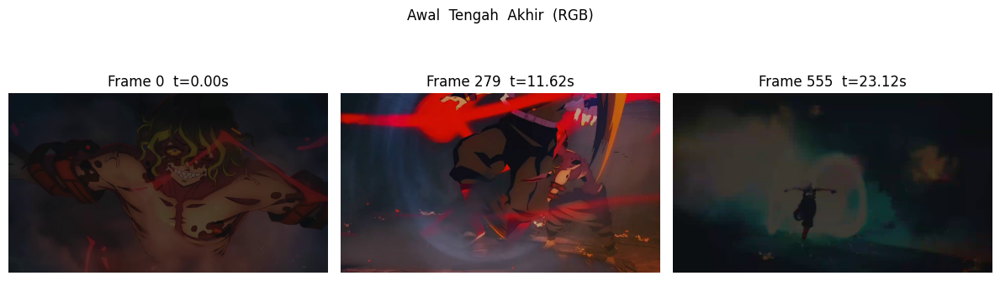

In [43]:
cap = cv2.VideoCapture(str(video_path))
assert cap.isOpened(), "Gagal buka video"

total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT) or 0)
fps   = float(cap.get(cv2.CAP_PROP_FPS) or 24.0)
dur   = total / fps if fps > 0 else 0.0

def read_rgb_at_index(cap, idx, backoff=5):
    for b in range(backoff+1):
        i = max(0, idx - b)
        cap.set(cv2.CAP_PROP_POS_FRAMES, i)
        ok, bgr = cap.read()
        if ok and bgr is not None:
            rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
            t = i / fps
            return rgb, i, t
    return None, None, None

def read_rgb_at_time(cap, t_sec):
    cap.set(cv2.CAP_PROP_POS_MSEC, max(0, 1000.0 * t_sec))
    ok, bgr = cap.read()
    if not ok or bgr is None:
        return None, None, None
    pos = int(cap.get(cv2.CAP_PROP_POS_FRAMES))
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    return rgb, pos, pos / fps

i0 = 0
i1 = max(0, total // 2)
i2 = max(0, total - 1)

f0 = read_rgb_at_index(cap, i0)[0]
f1 = read_rgb_at_index(cap, i1)[0]

f2, i2_real, t2_real = read_rgb_at_index(cap, i2, backoff=10)
if f2 is None:
    f2, i2_real, t2_real = read_rgb_at_time(cap, dur - 1.0 / fps - 1e-3)

cap.release()

titles = [
    f"Frame 0  t=0.00s",
    f"Frame {i1}  t={i1/fps:.2f}s",
    f"Frame {i2_real if i2_real is not None else 'N/A'}  t={t2_real:.2f}s" if t2_real is not None else "akhir (gagal)"
]

plt.figure(figsize=(12,4))
for k, frame in enumerate([f0, f1, f2]):
    ax = plt.subplot(1,3,k+1)
    if frame is None:
        ax.text(0.5, 0.5, "gagal baca", ha="center", va="center")
        ax.axis("off")
    else:
        ax.imshow(frame)
        ax.axis("off")
    ax.set_title(titles[k])
plt.suptitle("Awal  Tengah  Akhir  (RGB)")
plt.tight_layout()
plt.show()


**Analisis**

-  Awal 

    Close-up wajah lawan(Gyutaro), suasana gelap berkabut. Warna dominan gelap dengan aksen merah tipis. Gerak masih tenang, blur kecil. Ini terasa sebagai pembuka adegan, yang fokus ke ekspresi dan mood.
- Tengah

    Aksi lagi tinggi. Ada sapuan merah dan pusaran efek yang bikin motion blur kuat. Warna hangat lebih keluar, kontras tinggi. Pertarungan antara dual blade iconik milik tengen dengan kekuatan sabit darah milik Gyutaro yang berputar seperti gangsing.
- Akhir

    Sudah jadi wide shot. Tokoh Gyutaro tampak siluet kecil di tengah semacam cincin asap dan pusaran 2 Sabit. Palet bergeser ke kebiruan kehijauan, lebih gelap, detail halus berkurang karena jarak. Ini terasa sebagai penutup atau transisi keluar adegan.

### C4. Analisis Ringkas (Wajib)

**Jawab pertanyaan berikut:**

**Kesesuaian parameter:** Apakah fps dan resolusi video ini sesuai untuk use case pilihan Anda (misalnya: media sosial, kuliah daring, presentasi, dll.)? Jelaskan alasan singkat.

- Terbilang Cocok untuk diunggah di media sosial. 720p cukup tajam dilihat layar hp atau layar laptop, ukuran file juga ringan.

- 24 fps oke untuk cerita dan tampilan sinematik. Gerak masih terasa halus, apalagi untuk cuplikan anime.

- kalau tujuannya analisis gerak yang sangat presisi atau ingin slow motion mulus, lebih baik 60 fps. Kalau mau diputar di layar besar sekali, 1080p akan terlihat lebih bersih.

# Perbandingan & Kesimpulan

## Perbandingan Representasi Media

**TODO:** Bandingkan secara ringkas representasi dan visualisasi ketiga media:

### Audio (1D - Temporal)
- Representasi: sinyal amplitudo terhadap waktu
- Visualisasi utama: waveform, spectrogram log-dB, MFCC 13 koefisien
- Informasi yang diperoleh: ritme dan jeda dari waveform, isi frekuensi vokal/konsonan dan noise dari spectrogram, ringkasan bentuk spektral yang relatif stabil dari MFCC. Dalam audio pidato yang di pilih cenderung dual mono, energi kuat di bawah 5-6 kHz, tidak ada clipping mencolok.

### Gambar (2D - Spasial)  
- Representasi: matriks piksel H x W x 3 (RGB)
- Visualisasi utama: tampilan RGB yang benar, kanal terpisah, histogram R-G-B
- Informasi yang diperoleh: warna dominan dan kontras global. Pada foto basket, Red kuat di highlight, Blue kuat di mid sampai highlight, Green di midtone.

### Video (2D + Waktu - Spatio-temporal)
- Representasi: urutan frame 2D per waktu dengan metadata
- Visualisasi utama: tiga frame representatif awal - tengah - akhir
- Informasi yang diperoleh: perubahan warna dan skala shot, tingkat gerak dan motion blur, ritme adegan. Di cuplikan anime: awal gelap, tengah aksi terang cepat, akhir wide dan lebih dingin. Metadata 720p 24 fps sudah pas untuk presentasi dan unggah.

---

## Refleksi Pembelajaran

### 3 Poin yang Saya Pelajari:
1. Waveform bagus untuk ritme, sedangkan spectrogram menjawab frekuensi apa yang aktif. Keduanya saling melengkapi.
2. Perbedaan cara representasi suatu media audio, gambar, dan video 
3. Merubah BGR ke RGB di Opencv dengan numpy

### 2 Hal yang Masih Membingungkan/Ingin Diperdalam:
1. Cara membedakan hiss tipis dan hum halus pada rekaman jadul hanya dari spectrogram pendek.
2. Cara membaca visualisasi MFCC 13 koefisien

---

## Sumber Data & Referensi

**TODO:** Cantumkan semua sumber data dan referensi yang digunakan:

- **Audio:** https://www.youtube.com/shorts/c2GDzfnv6BU?si=vqAneDRQ0U3ft1dU
- **Gambar:** pin.it/68KaIIMW4
- **Video:** https://youtu.be/c1rBk7XAlj0?si=YvB103IUqxivVnQb
- **Referensi teknis:** https://g.co/gemini/share/0676d241bb45

# Panduan Pengumpulan

## 📁 Berkas yang Harus Dikumpulkan

### Wajib:
1. **Notebook Jupyter** (.ipynb) dengan nama: `NIM_Nama_TugasMultimedia.ipynb`
   - Contoh: `123456789_JohnDoe_TugasMultimedia.ipynb`
2. **PDF hasil render dari notebook**

---

## 📅 Informasi Pengumpulan

---

## ✅ Checklist Sebelum Submit

- [✅] Semua cell sudah dijalankan dan menampilkan output
- [✅] Nama file sesuai format: `NIM_Worksheet2.ipynb` dan `NIM_Worksheet2.pdf`
- [✅] Semua TODO sudah diisi dengan lengkap
- [✅] Analisis dan interpretasi sudah ditulis untuk setiap bagian
- [✅] Sumber data dan referensi sudah dicantumkan

---

### Export ke PDF:
- File → Save and Export Notebook As →  HTML
- Buka HTML di browser -> Save as PDF